# Week 5

Phew. You've handed in the assignment. But there's not resting now. We're just hitting out grove, so let's get going!! Much to get through today.

## The plan for today

We continue learning about dataviz by focusing on data with two variables and their relationships. The lecture today has the following parts:
* In part 1, we talk about exploring data with two variables, make some logarithmic plots and think about what we have read in DAOST.
* Then, in part 2, we use sklearn and have fun with linear regression.

Ok. Now it's time to get started.

In [25]:
import pandas as pd
pd.set_option('display.float_format', '{:.3f}'.format)
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Week 5

Phew. You've handed in the assignment. But there's not resting now. We're just hitting out grove, so let's get going!! Much to get through today.

## The plan for today

We continue learning about dataviz by focusing on data with two variables and their relationships. The lecture today has the following parts:
* In part 1, we talk about exploring data with two variables, make some logarithmic plots and think about what we have read in DAOST.
* Then, in part 2, we use sklearn and have fun with linear regression.

Ok. Now it's time to get started.

## Part 1: Exploratory data visualzation, two variables  

I told you how I love the Data Analysis with Open Source Tools book. You had to read Chapter 3, which is about visualizing data with two variables, before coming to class today. If you haven't yet, this is the time to do it! 

*Reading*: DAOST Chapter 3 up to *Graphical Analysis and Presentation Graphics* on page 68 in the PDF. **You will have to go and get it on DTU Learn due to the copyright stuff**.

And now a few exercises to reflect on the text:

### *Exercise:* Questions from DAOST Chapter 3.

> Looking at Fig 3-1, Janert writes "the data itself shows clearly that the amount of random noise in the data is small". What do you think his argument is?
>
> <font face="Comic sans MS" size="3" color="blue">  Based on this statement, Janert is likely asserting that the time series data in Fig 3-1 is relatively clean and does not contain a significant amount of random fluctuations or errors. This would suggest that any patterns or trends in the data are likely to be real and not simply artifacts of random noise.</font>

>Can you think of a real-world example of a multivariate relationship like the one in Fig 3-3 (lower right panel)?
>
><font face="Comic sans MS" size="3" color="blue">  Customer satisfaction, price, and product quality: In business, there is often a multivariate relationship between customer satisfaction, price, and product quality. Customers may be willing to pay a higher price for a product if they perceive it to be of higher quality, and their satisfaction with the product may be influenced by both the price and quality. However, this relationship can also be influenced by other factors such as marketing, customer service, and brand reputation. By analyzing customer feedback data and sales data, businesses can investigate the multivariate relationship between customer satisfaction, price, and product quality and identify the factors that drive customer loyalty and repeat business.</font>


> What are the two methods Janert metions for smoothing noisy data? Can you think of other ones?
>
> <font face="Comic sans MS" size="3" color="blue">  Janert mentions two methods for smoothing noisy data: Weighted Splines and LOESS.</font>
>   
> * <font face="Comic sans MS" size="3" color="blue"> <u>Weighted Splines</u> are constructed from piecewise polynomial functions (typically cubic) that are joined together in a smooth fashion. Each polynomial is fitted to a subset of the data points, and the curve is created by joining the smaller curves together. The overall shape of the curve is controlled by a smoothing parameter that balances the trade-off between fitting the data precisely and creating a smooth curve.
>
>
> * <font face="Comic sans MS" size="3" color="blue"> <u>LOESS</u> (Locally Weighted Scatterplot Smoothing) is a non-parametric regression method for smoothing noisy data. It fits a curve to a small neighborhood of data points around each point of interest, using a weighted regression that gives more importance to nearby points. The resulting curve is a combination of all the smaller curves fitted to the local data neighborhoods. The degree of smoothing in LOESS is controlled by a parameter called the bandwidth, which determines the size of the local neighborhood.</font>
>
> <font face="Comic sans MS" size="3" color="blue">Other methods for smoothing noisy data include:
>
> * <font face="Comic sans MS" size="3" color="blue">Moving Average: This method takes the average of neighboring data points within a moving window and replaces the central value with this average. It is a simple and effective method for smoothing out random noise and short-term fluctuations in the data.
>
> * <font face="Comic sans MS" size="3" color="blue">Savitzky-Golay Filter: This is a type of polynomial filter that fits a polynomial curve to a set of neighboring data points and uses the curve to smooth out the data. It can be effective in removing noise while preserving the underlying trend in the data.
>
> * <font face="Comic sans MS" size="3" color="blue">Exponential Smoothing: This method assigns exponentially decreasing weights to past observations and uses them to compute a weighted moving average. It is useful for smoothing out seasonal or cyclical patterns in the data.
>
> > * <font face="Comic sans MS" size="2" color="darkbrown">LOESS and Moving Average are different methods for smoothing noisy data, although they share some similarities.
>
> > * <font face="Comic sans MS" size="2" color="darkbrown">Moving Average is a simple method that takes the average of neighboring data points within a moving window and replaces the central value with this average. The size of the moving window is a parameter that determines the degree of smoothing, with larger window sizes leading to smoother curves. Moving Average is a good method for removing short-term fluctuations in the data but may not preserve longer-term trends or patterns.
>
> > * <font face="Comic sans MS" size="2" color="darkbrown">LOESS, on the other hand, is a more sophisticated method that fits a curve to a small neighborhood of data points around each point of interest, using a weighted regression that gives more importance to nearby points. The resulting curve is a combination of all the smaller curves fitted to the local data neighborhoods. The degree of smoothing in LOESS is controlled by a parameter called the bandwidth, which determines the size of the local neighborhood. LOESS is more flexible than Moving Average and can capture more complex patterns and trends in the data.
>
> ><font face="Comic sans MS" size="3" color="darkbrown">In summary, while both methods can be used for smoothing noisy data, LOESS is a more powerful and flexible method that can capture more complex patterns and trends in the data, while Moving Average is a simpler method that is useful for removing short-term fluctuations.
    

>What are residuals? Why is it a good idea to plot the residuals of your fit?
>
><font face="Comic sans MS" size="3" color="blue">Residuals are the differences between the actual data points and the values predicted by a model. When you fit a model to data, there is always some degree of error or variation between the actual data and the model's predictions.
>
><font face="Comic sans MS" size="3" color="blue">Plotting the residuals can help you evaluate how well the model fits the data. If there is a pattern in the residuals, it may mean the model is not capturing something important in the data. It can also help you identify data points that are not explained well by the model.
>
><font face="Comic sans MS" size="3" color="blue">Plotting the residuals can help you evaluate how well the model fits the data. If there is a pattern in the residuals, it may mean the model is not capturing something important in the data. It can also help you identify data points that are not explained well by the model.
    

    
>Explain in your own words the point of the smooth tube in figure 3-7.
><font face="Comic sans MS" size="3" color="blue">The smooth tube is a graphical representation of the variability in the data. The central line of the tube represents the average or best estimate of the underlying trend in the data, while the width of the tube represents the range of likely values around this estimate.
>
><font face="Comic sans MS" size="3" color="blue">The smooth tube is useful for visualizing the uncertainty or variability in the data, which can help assess the reliability and precision of a model. It can help identify any patterns or trends in the data, as well as any outliers or anomalies that may need further investigation.
>
><font face="Comic sans MS" size="3" color="blue">In the context of Figure 3-7, the smooth tube represents the variability in the finishing times of the marathon runners. The central line represents the average or best estimate of the finishing times over time, while the width of the tube represents the range of likely finishing times around this estimate. By visualizing the variability in the data, the smooth tube can help us identify trends and patterns in the finishing times of the marathon runners over time, and make predictions about future finishing times based on past performance.
    
    
> What the h#ll is banking and what part of our visual system does it use to help us see patterns? What are potential problems with banking?
>
><font face="Comic sans MS" size="3" color="blue">Banking is a graphical method used to recognize changes or slopes of curves in a data set by adjusting the aspect ratio of the plot. The purpose of banking is to make the slopes of the curves approximately a 45-degree angle, which makes it easier for our visual system to detect patterns and changes in the data. By adjusting the aspect ratio of the plot, banking can open up a way to control the appearance of a plot and actively adjust the slopes of the curves.
>
><font face="Comic sans MS" size="3" color="blue">The potential problems with banking include the creation of artificial patterns that are not present in the data and different interpretations of the banking display, leading to potential inconsistencies or biases in the analysis. Additionally, highly skewed aspect ratios can violate the great affinity humans have for proportions of roughly 4 by 3, which can make it difficult to interpret the data.
>
><font face="Comic sans MS" size="3" color="blue">Overall, banking is a good technique to improve human perception of the graph, but it can be taken too literally. When the aspect ratio required to achieve proper banking is too skewed, it is usually better to rethink the entire graph.
    
    
>Summarize the discussion of Graphical Analysis and Presentation Graphics on pp. 68-69 in your own words.
><font face="Comic sans MS" size="3" color="blue">Graphical analysis is using graphical methods to discover new information about a data set, while presentation graphics are used to communicate already understood information. During the analysis process, convenience and ease of use are the predominant concerns, while for presentation graphics, textual information becomes very important. The text should be self-explanatory, axes and labels should be clear, appropriate fonts and sizes should be used, appropriate plot ranges should be chosen, and graphs should be proofread for common errors. It's important to develop an interest in graphs to create good presentation graphics and to pay attention to details such as the thickness of lines, the size of labels, and the choice of colors.

*Exercise 2.2*: Logarithms and logarithmic plots. 

>    * What kind of relationships will a semi-log plot help you discover?
><font face="Comic sans MS" size="3" color="blue">A semi-log plot is a type of plot where one axis is scaled logarithmically and the other axis is linear. It is useful in visualizing data that has an exponential relationship between variables. In a semi-log plot, you can easily identify exponential growth or decay relationships between variables. It is especially useful when the data covers a wide range of values and the trend is not easily visible in a linear plot. For example, a semi-log plot can be used to analyze the growth of bacterial colonies over time or the growth of a company's revenue over several years.


>    * What kind of functions will loglog plots help you see?
><font face="Comic sans MS" size="3" color="blue">A loglog plot is a type of data visualization that displays the data on a logarithmic scale on both the x and y-axis. This type of plot helps to identify power-law relationships between variables, where one variable changes proportional to the other raised to a certain power. In other words, a loglog plot helps to see functions where the rate of change of one variable is directly proportional to the rate of change of the other variable, such as exponential or polynomial functions.
 
> * Second, we are going to create a version of [this plot](https://github.com/suneman/socialdata2022/blob/main/files/CrimeOccurrencesByCategory.png) from Week 1, where you display the $y$-axis on log-scale. 


In [26]:
data_link = 'D:\DTU\SP 2023\Social Data Viz\Data'
df = pd.read_pickle(data_link+'\ordered_Police_Department_Incident_Reports__Historical.pickle')

In [27]:
'''data_link = 'D:\DTU\SP 2023\Social Data Viz\Data'
data = pd.read_csv(data_link+'\Police_Department_Incident_Reports__Historical_2003_to_May_2018.csv')
data = data[(data.Y < 50) & (data.X<-122)]
df = data.iloc[:, :14]

focuscrimes = sorted(set(['WEAPON LAWS', 'PROSTITUTION', 'DRIVING UNDER THE INFLUENCE', 'ROBBERY', 'BURGLARY',
                   'ASSAULT', 'DRUNKENNESS', 'DRUG/NARCOTIC', 'TRESPASS', 'LARCENY/THEFT', 'VANDALISM',
                   'VEHICLE THEFT', 'STOLEN PROPERTY', 'DISORDERLY CONDUCT']))

data_link = 'D:\DTU\SP 2023\Social Data Viz\Data'
data = pd.read_csv(data_link+'\Police_Department_Incident_Reports__Historical_2003_to_May_2018.csv')

# frist 14 columns
df = data.iloc[:, :14] 
df.loc[:, 'Date'] = pd.to_datetime(df['Date']) # convert date column to datetime object

# filter date # 'YYYY-MM-DD'
start_date = pd.to_datetime('2003-01-01')
end_date = pd.to_datetime('2017-12-31')

df = df[ (df['Date'] >= start_date) & (df['Date'] <= end_date)]'''

"data_link = 'D:\\DTU\\SP 2023\\Social Data Viz\\Data'\ndata = pd.read_csv(data_link+'\\Police_Department_Incident_Reports__Historical_2003_to_May_2018.csv')\ndata = data[(data.Y < 50) & (data.X<-122)]\ndf = data.iloc[:, :14]\n\nfocuscrimes = sorted(set(['WEAPON LAWS', 'PROSTITUTION', 'DRIVING UNDER THE INFLUENCE', 'ROBBERY', 'BURGLARY',\n                   'ASSAULT', 'DRUNKENNESS', 'DRUG/NARCOTIC', 'TRESPASS', 'LARCENY/THEFT', 'VANDALISM',\n                   'VEHICLE THEFT', 'STOLEN PROPERTY', 'DISORDERLY CONDUCT']))\n\ndata_link = 'D:\\DTU\\SP 2023\\Social Data Viz\\Data'\ndata = pd.read_csv(data_link+'\\Police_Department_Incident_Reports__Historical_2003_to_May_2018.csv')\n\n# frist 14 columns\ndf = data.iloc[:, :14] \ndf.loc[:, 'Date'] = pd.to_datetime(df['Date']) # convert date column to datetime object\n\n# filter date # 'YYYY-MM-DD'\nstart_date = pd.to_datetime('2003-01-01')\nend_date = pd.to_datetime('2017-12-31')\n\ndf = df[ (df['Date'] >= start_date) & (df['Date'] <= end_dat

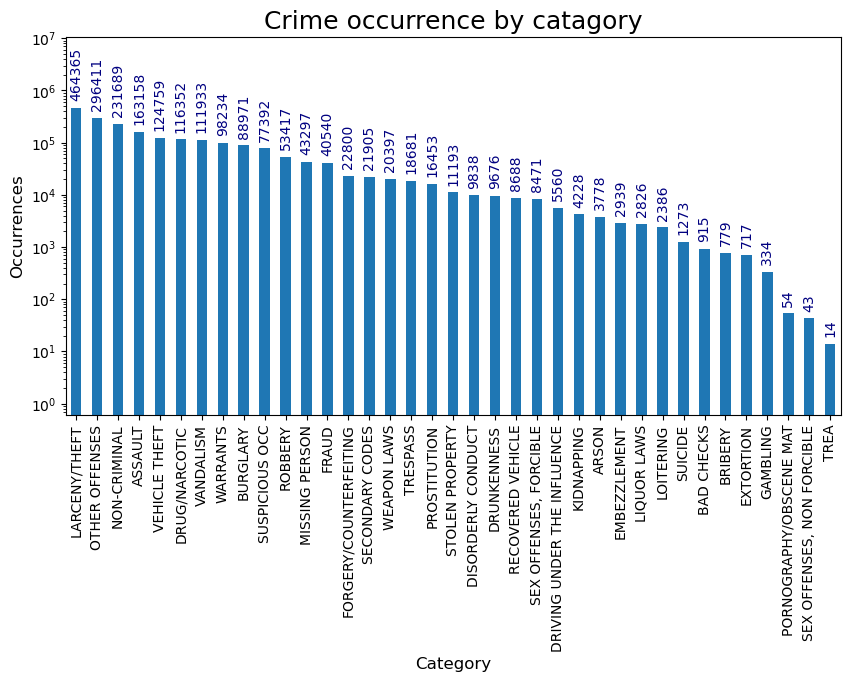

In [28]:
# Using Pandas visualization 
fig = plt.figure(figsize=(10,5), dpi=100);
ax = df['Category'].value_counts().plot(kind='bar')

for i in ax.containers:
    plt.bar_label(i, rotation = 90,  color='navy',padding=5)

plt.margins(x=0.0, y=0.3)

plt.yscale('log')
plt.title('Crime occurrence by catagory', fontsize=18)
plt.xticks(rotation = 90);
plt.xlabel('Category', fontsize=12);
plt.ylabel('Occurrences', fontsize=12);

> * Third, let's also try a loglog plot. Inspired by [this article](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0183110) I would expect that especially theft could be characterized by a power law distribution also in San Francisco. Let's see if I'm right. 
>   - *Step 1:* Divide San Francisco into a grid **roughly** $100m \times 100m$. You can, for example use numpy to do this, I would call `np.histogram2d`, and searching the internet, it seems that there are also [ways to do this in pandas](https://stackoverflow.com/questions/39254704/pandas-group-bins-of-data-per-longitude-latitude). The earth isn't flat,so `lat,` `lon` aren't really squares, but it is OK to ignore. 
>       * **Hint 1**. I really mean approximately 100 meters. It can also be 200 meters. Or 80 meters. Or 300.
>       * **Hint 2**. Ignore outliers. We only want points that are on the SF peninsula
>       * **Hint 3**. We've made a little example of how you can do the binning. Get it [here](https://github.com/suneman/socialdata2022/blob/main/lectures/Week5_binning.ipynb).
>   - *Step 2:* Count the number of thefts occurring within each grid-square (use all data for all time).
>   - *Step 3:* Tally the counts. Count the number of squares with $k=0$ thefts. We call this $N(0)$. Next, count the number of grids with one crime to get $N(k=1)$. Keep going like this all the way up to $k=C_{max}$, where $C_{max}$ is the highest count of crimes you find in any grid space. 
>     * *Extra tip*: If you want all the details on binning for loglog axes, you can check out [Lecture 2, Part 3](https://github.com/SocialComplexityLab/socialgraphs2021/blob/main/lectures/Week2.ipynb) in my social graphs course.
>   - *Step 4:* Plot the distribution of $k+1$ vs $N(k)$ on linear axes.
>   - *Step 5:* Plot the distribution of $k+1$ vs $N(k)$ on loglog axes.
>   - *Step 6:* Answer the question. Was Sune correct in assuming that there is a power-law distribution of theft?

In [29]:
import numpy as np

# Define the grid boundaries
lon_min, lon_max = -122.53, -122.35
lat_min, lat_max = 37.7, 37.83

# Define the grid size
grid_size = 0.001

# Create the grid using numpy.histogram2d
bins_lon = np.arange(lon_min, lon_max, grid_size)
bins_lat = np.arange(lat_min, lat_max, grid_size)

grid, _, _ = np.histogram2d(df['Y'], df['X'], bins=(bins_lat, bins_lon))

In [30]:
# Filter the dataframe to only include rows where Category is 'LARCENY/THEFT'
df_theft = df[df['Category'] == 'LARCENY/THEFT']

# Count the number of thefts in each grid square
theft_counts, _, _ = np.histogram2d(df_theft['Y'], df_theft['X'], bins=(bins_lat, bins_lon))

# Convert the count data to integer type
theft_counts = theft_counts.astype(int)

In [31]:
# Count the number of grid squares with k thefts for k from 0 to Cmax
Cmax = int(theft_counts.max())
n = np.zeros(Cmax+1)

for k in range(Cmax+1):
    n[k] = np.sum(theft_counts == k)

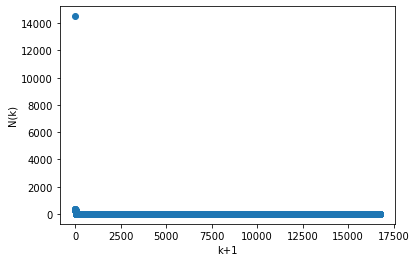

In [32]:
import matplotlib.pyplot as plt

# Plot the distribution of k+1 vs N(k) on linear axes
plt.plot(np.arange(Cmax+1)+1, n, 'o')
plt.xlabel('k+1')
plt.ylabel('N(k)')
plt.show()

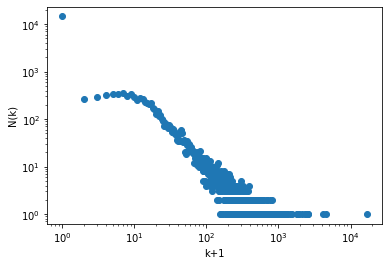

In [33]:
# Plot the distribution of k+1 vs N(k) on log-log axes
plt.loglog(np.arange(Cmax+1)+1, n, 'o')
plt.xlabel('k+1')
plt.ylabel('N(k)')
plt.show()

## Part 2: Linear Regression

So, now it's time for fun with standard linear regression! We'll get into that by asking the following question. 

> *Which pair of focus crimes have the the most similar temporal pattern across the week? (And which pair is most dissimilar).*

Below I list the focus-crimes for your convenience

In [34]:
focuscrimes = list(set(['WEAPON LAWS', 'PROSTITUTION', 'DRIVING UNDER THE INFLUENCE', 'ROBBERY', 'BURGLARY', 'ASSAULT', 'DRUNKENNESS', 'DRUG/NARCOTIC', 'TRESPASS', 'LARCENY/THEFT', 'VANDALISM', 'VEHICLE THEFT', 'STOLEN PROPERTY', 'DISORDERLY CONDUCT']))

One way to answer this question is to plot the activity for all pairs of crimetypes as scatter plot per pair. One crime type on each axis, and where each point in the scatter corresponds to an hour of the week, and the number of crimes of crime-type 1 is on the $x$-axis and the number of crimes of crime-type 2 is on the $y$-axis. (So there will be 168 points in each scatterplot.) If we look at 14 focus crimes that results in 91 pairwise comparisons. 

*Exercise*: Create the 91 scatterplots.
> * Display the plots in a $7$ by $13$ subplot matrix. You can use matplotlib's `subplot` to organize those plots. With $7$ across and $13$ down, you should be able to squeeze them all onto a single [a4](https://en.wikipedia.org/wiki/ISO_216#A_series) page.
>     * Make sure to label each one with the two crime-types you're comparing so we can easily inspect visually.
>     * Make sure that that you squeeze the subplots closely together so each plot can be as big as possible. 
> * Just inspecting this matrix, which crime-types look correlated and which one look like they're very different?

# other way around

In [36]:
df.head()

,PdId,IncidntNum,Incident Code,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,location,Year,Month,Day,Hour,Minute
0,4133422003074,41334220,3074,ROBBERY,"ROBBERY, BODILY FORCE",Monday,2004-11-22,1900-01-01 17:50:00,INGLESIDE,NONE,GENEVA AV / SANTOS ST,-122.420,37.708,POINT (-122.420084075249 37.7083109744362),2004,11,22,17,50
1,5118535807021,51185358,7021,VEHICLE THEFT,STOLEN AUTOMOBILE,Tuesday,2005-10-18,1900-01-01 20:00:00,PARK,NONE,TURK ST / STJOSEPHS AV,-120.500,90.000,POINT (-120.50000000000001 90),2005,10,18,20,0
2,4018830907021,40188309,7021,VEHICLE THEFT,STOLEN AUTOMOBILE,Sunday,2004-02-15,1900-01-01 02:00:00,SOUTHERN,NONE,BRANNAN ST / 1ST ST,-120.500,90.000,POINT (-120.50000000000001 90),2004,2,15,2,0
3,11014543126030,110145431,26030,ARSON,ARSON,Friday,2011-02-18,1900-01-01 05:27:00,INGLESIDE,NONE,0 Block of SANJUAN AV,-122.436,37.724,POINT (-122.43622001281001 37.7243766140428),2011,2,18,5,27
4,10108108004134,101081080,4134,ASSAULT,BATTERY,Sunday,2010-11-21,1900-01-01 17:00:00,SOUTHERN,NONE,400 Block of 10TH ST,-122.411,37.771,POINT (-122.410541166987 37.7709130566165),2010,11,21,17,0


In [38]:
df['DayOfWeek']=df['DayOfWeek'].astype('str')
df['HourOfWeek'] = df['DayOfWeek'].map(lambda x: {'Monday': 0, 'Tuesday': 24, 'Wednesday': 48, 'Thursday': 72, 'Friday': 96, 'Saturday': 120, 'Sunday': 144}[x]) + df['Hour']

In [39]:
df_focus = df[df['Category'].isin(focuscrimes)]

grouped = df_focus.groupby(['Category', 'Month'])['IncidntNum'].count()
df_grouped = grouped.reset_index(name='Count')

In [40]:
# Pivot the DataFrame to create a matrix where the rows are the hours of the week and the columns are the focus crimes
df_pivot = df_grouped.pivot(index='Month', columns='Category', values='Count')

In [41]:
df_pivot

Category,ASSAULT,BURGLARY,DISORDERLY CONDUCT,DRIVING UNDER THE INFLUENCE,DRUG/NARCOTIC,DRUNKENNESS,LARCENY/THEFT,PROSTITUTION,ROBBERY,STOLEN PROPERTY,TRESPASS,VANDALISM,VEHICLE THEFT,WEAPON LAWS
Month,,,,,,,,,,,,,,
1,13487,7561,871,453,10937,827,37800,1622,4508,1002,1671,9167,10185,1695
2,12542,6685,784,483,10356,743,34067,1419,3880,847,1359,8258,9328,1622
3,14121,7697,877,503,10831,838,37853,1301,4188,962,1633,9611,10365,1808
4,13577,7462,798,422,9665,783,37146,1490,4430,916,1574,9384,10471,1673
5,13906,7602,885,508,9789,859,38402,1359,4521,951,1686,9385,10327,1669
6,13499,7060,753,383,8636,775,38023,1201,4568,881,1513,9244,10057,1632
7,13560,7604,791,428,8994,785,40762,1246,4570,958,1566,9980,10403,1699
8,13933,7513,847,471,10099,854,41501,1299,4834,1011,1587,9629,10923,1753
9,14407,7174,863,487,9684,809,40136,1528,4410,962,1592,9385,10608,1700


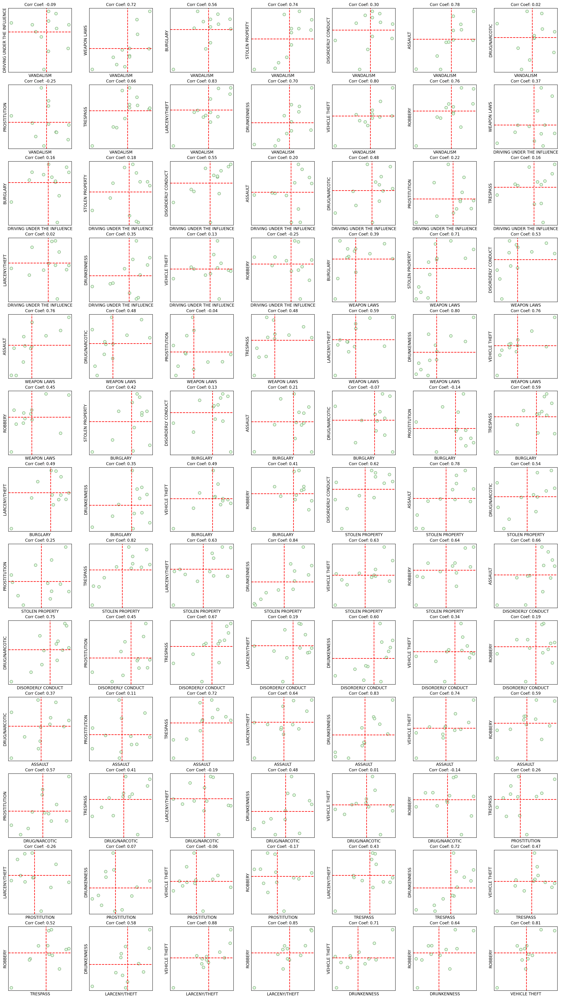

In [45]:
fig, ax = plt.subplots(13, 7, figsize=(20, 35), dpi=200, sharex=False, sharey=False)

plt.tight_layout() # automatically adjust the spacing between the subplots

L = []
for i, crime1 in enumerate(focuscrimes):
    for j, crime2 in enumerate(focuscrimes):
        if i < j:
            L.append([i,j])
            
for index, axes in enumerate(ax.flatten()):
    axes.scatter(df_pivot[focuscrimes[(L[index][0])]], df_pivot[focuscrimes[(L[index][1])]], s=50, alpha=0.9,
                color='#DDFFDD', edgecolor="#6A9662")
# Add a line to show the average count for crime
    axes.axvline(df_pivot[focuscrimes[(L[index][0])]].mean(), color='red', linestyle='dashed')            
    axes.axhline(df_pivot[focuscrimes[(L[index][1])]].mean(), color='red', linestyle='dashed')
    
    corr = df_pivot[focuscrimes[(L[index][0])]].corr(df_pivot[focuscrimes[(L[index][1])]])
    axes.set_title('Corr Coef: {:.2f}'.format(corr), fontsize=10)
    
    axes.set_xticks([])
    axes.set_yticks([])
    axes.set_xlabel(focuscrimes[L[index][0]], fontsize=10)
    axes.set_ylabel(focuscrimes[L[index][1]], fontsize=10)
    fig.patch.set_facecolor('white')
    
    #plt.xticks(fontsize=6)
    #plt.yticks(fontsize=6)

---

Next it's time for the linear regression. Janert writes about this on page 63-66. 

There is a closed-form solution for linear regression. If you want to find the best straight line $y = ax + b$ fit to a set of $N$ points $\{(x_1,y_1), (x_2,y_2), \ldots (x_N,y_N)\}$, the value of $b$ is

$$
\tag{1}
b = \langle y \rangle - a \langle x \rangle,
$$

where $\langle x \rangle = (1/N)\sum_i x_i$ is the mean value of the $x_i$ and $\langle y \rangle = (1/N)\sum_i x_i$ is the mean value of the $y_i$. 

And the value for the slope $a$ is 

$$
\tag{2}
a = \frac{\sum_{i=1}^N \left( x_iy_i \right) - N \langle x\rangle\langle y\rangle }{\sum_{i=1}^N\left( x_i^2 \right) - N\langle x\rangle^2}.
$$


A couple of years ago, I actually derived the whole thing. I've taken it out of the notebook. But if you'd like to take a look (it's a fun and instructive little exercise), you can find it **[here](https://github.com/suneman/socialdata2021/blob/main/lectures/LinearRegressionDerived.ipynb)**. 

We are going to focus on the fit for now, but keep in mind what we have learnt so far about the purpose of linear regression! 

*Exercise:* Linear regression.

> * Using the formulas we derived above (Equation 1 and 2), calculate the slopes for $a$ and $b$ in each case. (You can compare the results with ones obtained using a package like `sklearn` to check that everything is working as expected.)


In [46]:
# Calculate slopes and intercepts for all pairs of focus crimes
slopes = {}
intercepts = {}
for i, crime1 in enumerate(focuscrimes):
    for j, crime2 in enumerate(focuscrimes):
        if i < j:
            # Calculate mean values of x and y
            x_mean = np.mean(df_pivot[crime1])
            y_mean = np.mean(df_pivot[crime2])
            
            # Calculate numerator and denominator for slope
            numerator = np.sum(df_pivot[crime1] * df_pivot[crime2]) - len(df_pivot) * x_mean * y_mean
            denominator = np.sum(df_pivot[crime1]**2) - len(df_pivot) * x_mean**2
            
            # Calculate slope and intercept
            slope = numerator / denominator
            intercept = y_mean - slope * x_mean
            
            # Store results in dictionaries
            pair = crime1 + ' vs. ' + crime2
            slopes[pair] = slope
            intercepts[pair] = intercept
            
# Print slopes and intercepts for each pair
for pair in slopes:
    print(pair + ': slope = ' + str(slopes[pair]) + ', intercept = ' + str(intercepts[pair]))

VANDALISM vs. DRIVING UNDER THE INFLUENCE: slope = -0.006734488460779834, intercept = 526.1509580733724
VANDALISM vs. WEAPON LAWS: slope = 0.10269088459181365, intercept = 741.8751012487103
VANDALISM vs. BURGLARY: slope = 0.3564032550751147, intercept = 4089.8095374730988
VANDALISM vs. STOLEN PROPERTY: slope = 0.09060369540401651, intercept = 87.621380195185
VANDALISM vs. DISORDERLY CONDUCT: slope = 0.037454893816756436, intercept = 470.4634475340835
VANDALISM vs. ASSAULT: slope = 1.0699783131158238, intercept = 3616.0097898338736
VANDALISM vs. DRUG/NARCOTIC: slope = 0.028534054841501427, intercept = 9429.841469952185
VANDALISM vs. PROSTITUTION: slope = -0.06382144429182245, intercept = 1966.39381032638
VANDALISM vs. TRESPASS: slope = 0.1282790200831855, intercept = 360.1953704190664
VANDALISM vs. LARCENY/THEFT: slope = 3.6116549907708144, intercept = 5008.468493170869
VANDALISM vs. DRUNKENNESS: slope = 0.07601174460371139, intercept = 97.31478260606445
VANDALISM vs. VEHICLE THEFT: slo

In [47]:
# List to store the slope and intercept values for each pair of focus crimes
coeffs_list = []

for i, crime1 in enumerate(focuscrimes):
    for j, crime2 in enumerate(focuscrimes):
        if i < j:
            x = df_pivot[crime1]
            y = df_pivot[crime2]
            # Calculate the mean of x and y
            x_mean = x.mean()
            y_mean = y.mean()
            # Calculate the slope and intercept
            a = ((x*y).sum() - len(x)*x_mean*y_mean) / ((x**2).sum() - len(x)*x_mean**2)
            b = y_mean - a*x_mean
            # Append the results to the list
            coeffs_list.append([crime1, crime2, a, b])

# Create a DataFrame from the list
coeffs_df = pd.DataFrame(coeffs_list, columns=['Crime1', 'Crime2', 'Slope', 'Intercept'])
coeffs_df

,Crime1,Crime2,Slope,Intercept
0,VANDALISM,DRIVING UNDER THE INFLUENCE,-0.007,526.151
1,VANDALISM,WEAPON LAWS,0.103,741.875
2,VANDALISM,BURGLARY,0.356,4089.810
3,VANDALISM,STOLEN PROPERTY,0.091,87.621
4,VANDALISM,DISORDERLY CONDUCT,0.037,470.463
...,...,...,...,...
86,LARCENY/THEFT,VEHICLE THEFT,0.206,2407.606
87,LARCENY/THEFT,ROBBERY,0.105,386.730
88,DRUNKENNESS,VEHICLE THEFT,6.732,4968.091
89,DRUNKENNESS,ROBBERY,3.167,1898.148


In [48]:
coeffs_df = pd.DataFrame(columns=['Crime1', 'Crime2', 'Slope', 'Intercept', 'R2', 'Correlation'])

for i, crime1 in enumerate(focuscrimes):
    for j, crime2 in enumerate(focuscrimes):
        if i < j:
            x = df_pivot[crime1].values.reshape(-1, 1)
            y = df_pivot[crime2].values.reshape(-1, 1)
            reg = LinearRegression().fit(x, y)
            slope = reg.coef_[0][0]
            intercept = reg.intercept_[0]
            r2 = reg.score(x, y)
            corr = df_pivot[crime1].corr(df_pivot[crime2])
            coeffs_df = pd.concat([coeffs_df, pd.DataFrame({'Crime1': crime1, 'Crime2': crime2, 'Slope': slope, 'Intercept': intercept, 'R2': r2, 'Correlation': corr}, index=[0])])

#top5_coeffs_df = coeffs_df.nlargest(5, 'R2')
coeffs_df

,Crime1,Crime2,Slope,Intercept,R2,Correlation
0,VANDALISM,DRIVING UNDER THE INFLUENCE,-0.007,526.151,0.008,-0.089
0,VANDALISM,WEAPON LAWS,0.103,741.875,0.525,0.724
0,VANDALISM,BURGLARY,0.356,4089.810,0.318,0.564
0,VANDALISM,STOLEN PROPERTY,0.091,87.621,0.545,0.738
0,VANDALISM,DISORDERLY CONDUCT,0.037,470.463,0.090,0.301
...,...,...,...,...,...,...
0,LARCENY/THEFT,VEHICLE THEFT,0.206,2407.606,0.767,0.876
0,LARCENY/THEFT,ROBBERY,0.105,386.730,0.727,0.852
0,DRUNKENNESS,VEHICLE THEFT,6.732,4968.091,0.502,0.709
0,DRUNKENNESS,ROBBERY,3.167,1898.148,0.407,0.638


> * You can add even more information to this plot by coloring each point according to its hour of the week. So create a gradient going from one color to another, and color each point according to the gradient. (So let's say your two colors are red and blue, then the Sunday, midnight to 1am bin will be red and the following Sunday, 11pm - midnight bin will be blue).

In [50]:
df_pivot

Category,ASSAULT,BURGLARY,DISORDERLY CONDUCT,DRIVING UNDER THE INFLUENCE,DRUG/NARCOTIC,DRUNKENNESS,LARCENY/THEFT,PROSTITUTION,ROBBERY,STOLEN PROPERTY,TRESPASS,VANDALISM,VEHICLE THEFT,WEAPON LAWS
Month,,,,,,,,,,,,,,
1,13487,7561,871,453,10937,827,37800,1622,4508,1002,1671,9167,10185,1695
2,12542,6685,784,483,10356,743,34067,1419,3880,847,1359,8258,9328,1622
3,14121,7697,877,503,10831,838,37853,1301,4188,962,1633,9611,10365,1808
4,13577,7462,798,422,9665,783,37146,1490,4430,916,1574,9384,10471,1673
5,13906,7602,885,508,9789,859,38402,1359,4521,951,1686,9385,10327,1669
6,13499,7060,753,383,8636,775,38023,1201,4568,881,1513,9244,10057,1632
7,13560,7604,791,428,8994,785,40762,1246,4570,958,1566,9980,10403,1699
8,13933,7513,847,471,10099,854,41501,1299,4834,1011,1587,9629,10923,1753
9,14407,7174,863,487,9684,809,40136,1528,4410,962,1592,9385,10608,1700


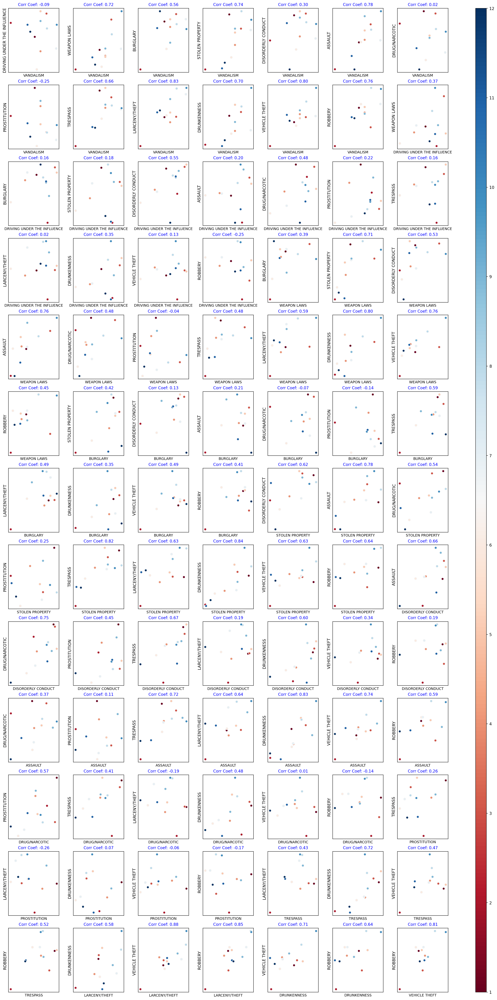

In [56]:
#df_pivot = df_grouped.pivot(index='HourOfWeek', columns='Category', values='Count')
df_pivot['Month']=df_pivot.index
fig, ax = plt.subplots(13, 7, figsize=(20, 35), dpi=200, sharex=False, sharey=False)

plt.tight_layout() # automatically adjust the spacing between the subplots

# Create a color map based on the HourOfWeek column
cmap = plt.get_cmap('RdBu')
month = np.arange(1,13)

L = []
for i, crime1 in enumerate(focuscrimes):
    for j, crime2 in enumerate(focuscrimes):
        if i < j:
            L.append([i,j])
            
for index, axes in enumerate(ax.flatten()):
    # Get the crime types for this plot
    crime1 = focuscrimes[L[index][0]]
    crime2 = focuscrimes[L[index][1]]
    
    # Scatter plot with colored points
    sc = axes.scatter(df_pivot[crime1], df_pivot[crime2], s=35, c=df_pivot['Month'], cmap=cmap, edgecolor="whitesmoke")
    
    # Set axis labels
    axes.set_xlabel(crime1, fontsize=9)
    axes.set_ylabel(crime2, fontsize=10)
    
    # Set ticks and grid lines
    axes.set_xticks([])
    axes.set_yticks([])
    axes.grid(linestyle=':', linewidth=0.4, color='gray', alpha=0.5)
      
    
    corr = df_pivot[focuscrimes[(L[index][0])]].corr(df_pivot[focuscrimes[(L[index][1])]])
    axes.set_title('Corr Coef: {:.2f}'.format(corr), fontsize=10, color="Blue")

# Add color bar to plot    
cbar = fig.colorbar(sc, ax=ax, aspect=90)  
cbar.set_ticks(month)
#cbar.set_ticklabels(['Sun', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat'])
fig.patch.set_facecolor('white')


---

But the question we started with was "Which pair of focus crimes have the the most similar temporal pattern across the week?". We haven't really answered that yet. So let's calculate one last thing: $R^2$. You probably also remember this one. 

Basically $R^2$ is a measures of how good a linear fit is. You can [read about $R^2$ on wikipedia](https://en.wikipedia.org/wiki/Coefficient_of_determination). 

*Exercise:* Goodness of fit as a measure of correlation. 
> * Write a little function to calculate $R^2$ alongside each linear fit. (Again you can compare it with a package to check that it works, e.g. the one provided by the function `score()` in `sklearn`.)

In [57]:
#already done
coeffs_df

,Crime1,Crime2,Slope,Intercept,R2,Correlation
0,VANDALISM,DRIVING UNDER THE INFLUENCE,-0.007,526.151,0.008,-0.089
0,VANDALISM,WEAPON LAWS,0.103,741.875,0.525,0.724
0,VANDALISM,BURGLARY,0.356,4089.810,0.318,0.564
0,VANDALISM,STOLEN PROPERTY,0.091,87.621,0.545,0.738
0,VANDALISM,DISORDERLY CONDUCT,0.037,470.463,0.090,0.301
...,...,...,...,...,...,...
0,LARCENY/THEFT,VEHICLE THEFT,0.206,2407.606,0.767,0.876
0,LARCENY/THEFT,ROBBERY,0.105,386.730,0.727,0.852
0,DRUNKENNESS,VEHICLE THEFT,6.732,4968.091,0.502,0.709
0,DRUNKENNESS,ROBBERY,3.167,1898.148,0.407,0.638


> * Explain the connection between $R^2$ and the [Pearson correlation coefficient](https://en.wikipedia.org/wiki/Pearson_correlation_coefficient).

> <font face="Comic sans MS" size="3" color="blue">The Pearson correlation coefficient is a measure of the linear correlation (the strength and direction of the relationship) between two variables. It ranges from -1 to +1, where -1 means a perfect negative linear correlation, +1 means a perfect positive linear correlation, and 0 means no linear correlation.
>
> <font face="Comic sans MS" size="3" color="blue">R-squared (𝑅2), on the other hand, is a statistical measure that represents the proportion of the variance in one variable that is predictable from another variable. It ranges from 0 to 1, where 0 means no predictability and 1 means perfect predictability.
>
> <font face="Comic sans MS" size="3" color="blue">In the context of linear regression, the square of the Pearson correlation coefficient between the predictor variable and the response variable is equal to the R-squared value. This means that if the Pearson correlation coefficient is positive (indicating a positive linear relationship), then the R-squared value will be positive as well, indicating a higher degree of predictability. Similarly, if the Pearson correlation coefficient is negative (indicating a negative linear relationship), then the R-squared value will be negative as well. Thus, the Pearson correlation coefficient can be seen as a measure of the strength of the linear relationship between the two variables, while the R-squared value represents the proportion of the variability in the response variable that can be explained by the predictor variable.

> * **According to the fits and associated $R^2$**, which pair of crimes have the **most similar** temporal pattern. Discuss your finding: Does it make sense? Why?/Why not?

In [58]:
coeffs_df.sort_values(by='R2', ascending=False).head(6)

,Crime1,Crime2,Slope,Intercept,R2,Correlation
0,LARCENY/THEFT,VEHICLE THEFT,0.206,2407.606,0.767,0.876
0,LARCENY/THEFT,ROBBERY,0.105,386.730,0.727,0.852
0,STOLEN PROPERTY,DRUNKENNESS,0.746,110.210,0.711,0.843
0,ASSAULT,DRUNKENNESS,0.066,-96.057,0.695,0.834
0,VANDALISM,LARCENY/THEFT,3.612,5008.468,0.682,0.826
0,STOLEN PROPERTY,TRESPASS,1.303,341.229,0.671,0.819


> * According to your fits and associated measure of $R^2$, which pair of crimes have the **most dissimilar** temporal pattern. Discuss your finding: Does it make sense? Why?/Why not?

In [59]:
coeffs_df.sort_values(by='R2', ascending=True).head(6)

,Crime1,Crime2,Slope,Intercept,R2,Correlation
0,DRUG/NARCOTIC,VEHICLE THEFT,0.007,10328.713,0.000,0.012
0,DRIVING UNDER THE INFLUENCE,LARCENY/THEFT,0.911,38274.896,0.000,0.016
0,VANDALISM,DRUG/NARCOTIC,0.029,9429.841,0.000,0.016
0,WEAPON LAWS,PROSTITUTION,-0.074,1496.220,0.002,-0.040
0,PROSTITUTION,VEHICLE THEFT,-0.249,10737.870,0.004,-0.062
0,BURGLARY,DRUG/NARCOTIC,-0.189,11097.479,0.005,-0.069


In [61]:
coeffs_df[coeffs_df['Crime1']=='DRUNKENNESS'].sort_values(by='R2', ascending=False)

,Crime1,Crime2,Slope,Intercept,R2,Correlation
0,DRUNKENNESS,VEHICLE THEFT,6.732,4968.091,0.502,0.709
0,DRUNKENNESS,ROBBERY,3.167,1898.148,0.407,0.638


In [63]:
coeffs_df[coeffs_df['Crime2']=='DRUNKENNESS'].sort_values(by='R2', ascending=False)

,Crime1,Crime2,Slope,Intercept,R2,Correlation
0,STOLEN PROPERTY,DRUNKENNESS,0.746,110.210,0.711,0.843
0,ASSAULT,DRUNKENNESS,0.066,-96.057,0.695,0.834
0,WEAPON LAWS,DRUNKENNESS,0.615,-238.968,0.644,0.803
0,TRESPASS,DRUNKENNESS,0.402,180.205,0.523,0.723
0,VANDALISM,DRUNKENNESS,0.076,97.315,0.490,0.700
0,DISORDERLY CONDUCT,DRUNKENNESS,0.523,377.174,0.360,0.600
0,LARCENY/THEFT,DRUNKENNESS,0.014,250.802,0.334,0.578
0,DRUG/NARCOTIC,DRUNKENNESS,0.030,513.997,0.232,0.482
0,DRIVING UNDER THE INFLUENCE,DRUNKENNESS,0.502,573.830,0.123,0.351
0,BURGLARY,DRUNKENNESS,0.060,364.805,0.120,0.347




> * Create a final mega-plot with all of the 91 megaplots, fits, and $R^2$ value written as [text](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.text.html) on each plot. In this figure, you should also find a way to visually highlight the two most similar/dissimilar crimes.

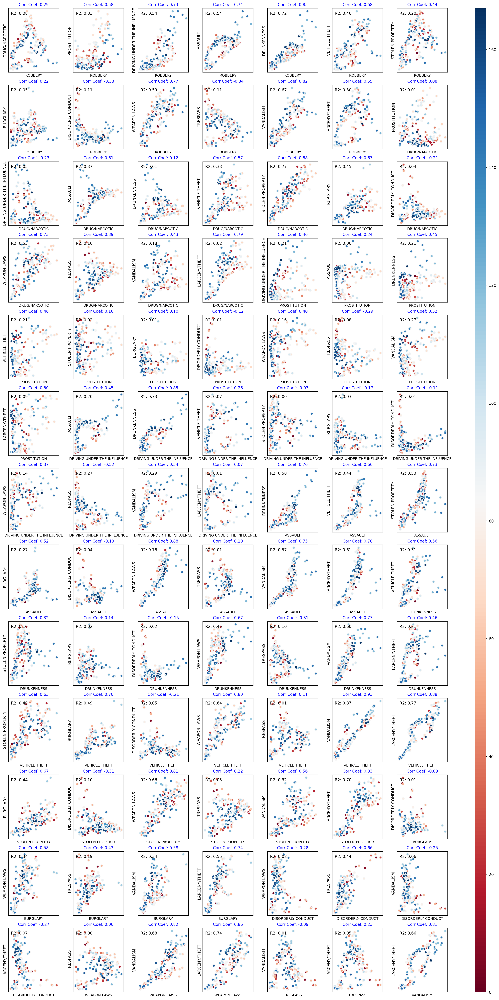

In [45]:
# create a pivot table from df_grouped with HourOfWeek as index, Category as columns, and Count as values
df_pivot = df_grouped.pivot(index='HourOfWeek', columns='Category', values='Count')
df_pivot['HourOfWeek']=df_pivot.index

# create a figure with 13 rows and 7 columns of subplots
fig, ax = plt.subplots(13, 7, figsize=(20, 35), dpi=200, sharex=False, sharey=False)

# adjust the spacing between the subplots
plt.tight_layout()

# create a color map based on the HourOfWeek column
cmap = plt.get_cmap('RdBu')
hours = np.arange(168)

# create a list of pairs of focus crimes to plot
L = []
for i, crime1 in enumerate(focuscrimes):
    for j, crime2 in enumerate(focuscrimes):
        if i < j:
            L.append([i,j])
            
# loop through each subplot in the figure
for index, axes in enumerate(ax.flatten()):
    # get the crime types for this subplot
    crime1 = focuscrimes[L[index][0]]
    crime2 = focuscrimes[L[index][1]]
    
    # scatter plot with colored points
    sc = axes.scatter(df_pivot[crime1], df_pivot[crime2], s=35, c=df_pivot['HourOfWeek'], cmap=cmap, edgecolor="whitesmoke")
    
    # set axis labels
    axes.set_xlabel(crime1, fontsize=9)
    axes.set_ylabel(crime2, fontsize=10)
    
    # remove x and y ticks and add grid lines
    axes.set_xticks([])
    axes.set_yticks([])
    axes.grid(linestyle=':', linewidth=0.4, color='gray', alpha=0.5)
    
    # add color bar to plot   
    cbar.set_ticks(hours[::24])
    cbar.set_ticklabels(['Sun', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat'])
    
    # calculate correlation coefficient and add it as subplot title
    corr = df_pivot[focuscrimes[(L[index][0])]].corr(df_pivot[focuscrimes[(L[index][1])]])
    axes.set_title('Corr Coef: {:.2f}'.format(corr), fontsize=10, color="Blue")
    
    # calculate R2 using the slope and intercept from coeffs_df and add it as subplot text
    a = coeffs_df.loc[(coeffs_df['Crime1'] == crime1) & (coeffs_df['Crime2'] == crime2)]['Slope'].values[0]
    b = coeffs_df.loc[(coeffs_df['Crime1'] == crime1) & (coeffs_df['Crime2'] == crime2)]['Intercept'].values[0]
    y_pred = a * df_pivot[crime1].values + b
    y_actual = df_pivot[crime2].values
    r2 = np.corrcoef(y_actual, y_pred)[0, 1] ** 2
    axes.text(0.05, 0.95, 'R2: {:.2f}'.format(r2), transform=axes.transAxes, fontsize=10, verticalalignment='top')
    
# set common facecolor for the figure
cbar = fig.colorbar(sc, ax=ax, aspect=90) 
fig.patch.set_facecolor('white')
